# Bipartite Network Analysis and Stability: Exploration of Exceptional Metadata and Missing Data on Network Structures of Shakespeare and Company Data

This notebook explores how we can represent s&Co data as a network and also how a network helps us assess whether exceptional member behavior impacts our network. 

#### Load Libraries and Initial Data

In [2]:

import pandas as pd
pd.options.mode.chained_assignment = None
pd.set_option('display.max_columns', None)

import warnings
warnings.filterwarnings("ignore")

import altair as alt 
alt.data_transformers.disable_max_rows()

import collections
import matplotlib.pyplot as plt

import sys
sys.path.append("..")
from network_analysis.load_datasets import get_updated_shxco_data
from network_analysis.generate_network_metrics import *
from network_analysis.create_networks import *
from network_analysis.read_write_networks import *
from network_analysis.visualize_networks import * 


#### Baseline datasets

Subset the data to only borrows prior to 1942.

In [2]:
members_df, books_df, borrow_events, events_df = get_updated_shxco_data(get_subscription=False)

In [3]:
unknown_borrows = borrow_events[borrow_events.start_datetime.isna()]

In [4]:
borrow_events = borrow_events[(borrow_events.start_datetime.isna() == False) & (borrow_events.end_datetime.isna() == False)]


In [5]:
all_borrows = borrow_events[borrow_events.start_datetime < '1942-01-01'].copy()

unexceptional_borrows = all_borrows[all_borrows.exceptional_types.isna()]

## If you want all events regardless of types, use this:
# all_borrows = events_df[events_df.item_uri.isna() == False].copy()

# unexceptional_borrows = all_borrows[all_borrows.exceptional_types.isna()]


### Bipartite Networks and Exceptional Metadata

We're creating two bipartite networks using all pre-1942 borrowing data. The first is the full dataset and the second is a subset with all 'exceptional' data removed. See the ExceptionalMetadata notebook for more details.

In [6]:
member_attrs = {'uri': 'member_id'}
book_attrs = {'uri': 'item_uri'}
edge_attrs = {'weight': 'counts'}
all_borrows_grouped = all_borrows.groupby(['member_id', 'item_uri']).size().reset_index(name='counts')
unexceptional_borrows_grouped = unexceptional_borrows.groupby(['member_id', 'item_uri']).size().reset_index(name='counts')
should_process = True
write_to_file = True
sk_metrics = ['katz', 'louvain']
link_metrics = ['HITS', 'CoHITS', 'BiRank', 'BGRM']


all_borrows_bipartite_graph, all_borrows_bipartite_nodelist, all_borrows_bipartite_edgelist, all_borrows_members, all_borrows_books = check_reload_build_bipartite_graphs(
    all_borrows_grouped, member_attrs, book_attrs, edge_attrs, should_process, write_to_file, '/Volumes/Samsung_T5/unknown_borrowers/network_analysis/public_data/borrow_events_bipartite', sk_metrics, link_metrics, members_df, books_df)

unexceptional_borrows_bipartite_graph, unexceptional_borrows_bipartite_nodelist, unexceptional_borrows_bipartite_edgelist, unexceptional_borrows_members, unexceptional_borrows_books = check_reload_build_bipartite_graphs(
    unexceptional_borrows_grouped, member_attrs, book_attrs, edge_attrs, should_process, write_to_file, '/Volumes/Samsung_T5/unknown_borrowers/network_analysis/public_data/unexceptional_borrow_events_bipartite', sk_metrics, link_metrics, members_df, books_df)


reloading saved graph: /Volumes/Samsung_T5/unknown_borrowers/network_analysis/public_data/borrow_events_bipartite
reloading saved graph: /Volumes/Samsung_T5/unknown_borrowers/network_analysis/public_data/unexceptional_borrow_events_bipartite


In [7]:
def plot_degree_histogram(g, normalized=True, weight='weight'):
    
    degree_sequence = sorted([d for n, d in g.degree(weight=weight)], reverse=True)  # degree sequence
    degreeCount = collections.Counter(degree_sequence)
    aux_x, aux_y = zip(*degreeCount.items())

    n_nodes = g.number_of_nodes()
    aux_y = list(aux_y)
    if normalized:
        for i in range(len(aux_y)):
            aux_y[i] = aux_y[i]/n_nodes
    
    return aux_x, aux_y

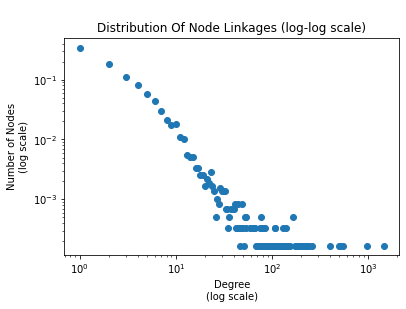

In [8]:
aux_x, aux_y = plot_degree_histogram(all_borrows_bipartite_graph)
plt.title('\nDistribution Of Node Linkages (log-log scale)')
plt.xlabel('Degree\n(log scale)')
plt.ylabel('Number of Nodes\n(log scale)')
plt.xscale("log")
plt.yscale("log")
plt.plot(aux_x, aux_y, 'o')

#### Correlations Between Bipartite Networks

Now we will explore the correlations between the two bipartite networks.

In [9]:
local_cols = [ col for col in all_borrows_members.columns.tolist() if 'local' in col]
global_cols = [ col for col in all_borrows_members.columns.tolist() if 'global' in col]

global_books_borrows = all_borrows_books[all_borrows_books.columns[~all_borrows_books.columns.isin(
    local_cols)]]
unexceptional_global_books_borrows = unexceptional_borrows_books[
    unexceptional_borrows_books.columns[~unexceptional_borrows_books.columns.isin(local_cols)]]

global_members_borrows = all_borrows_members[all_borrows_members.columns[~all_borrows_members.columns.isin(local_cols)]]
unexceptional_global_members_borrows = unexceptional_borrows_members[
    unexceptional_borrows_members.columns[~unexceptional_borrows_members.columns.isin(local_cols)]]

Here we are comparing the correlation in graph metrics for each graph, as well as the correlations for metrics run on the full graph versus the largest connected component.

In [10]:

all_borrows_corr_members_chart = generate_corr_chart(
    global_members_borrows, 'member correlations for all borrows data')
unexceptional_corr_members_chart = generate_corr_chart(
    unexceptional_global_members_borrows, 'member correlations for unexceptional data')

local_members_borrows = all_borrows_members[(
    all_borrows_members.columns[~all_borrows_members.columns.isin(global_cols)])]
unexceptional_local_members_borrows = unexceptional_borrows_members[(
    unexceptional_borrows_members.columns[~unexceptional_borrows_members.columns.isin(global_cols)])]
all_borrows_corr_members_chart_subset = generate_corr_chart(
    local_members_borrows[(local_members_borrows.component == 0)], ['member correlations for all borrows data', 'without disconnected nodes'])
unexceptional_corr_members_chart_subset = generate_corr_chart(
    unexceptional_local_members_borrows[(unexceptional_local_members_borrows.component == 0)], ['member correlations for unexceptional data', 'without disconnected nodes'])

alt.vconcat(
    alt.hconcat(*[all_borrows_corr_members_chart, unexceptional_corr_members_chart]),
    alt.hconcat(*[all_borrows_corr_members_chart_subset, unexceptional_corr_members_chart_subset])
)


alt.VConcatChart(...)

In [11]:
all_borrows_corr_books_chart = generate_corr_chart(
    global_books_borrows, 'book correlations for all borrows data')
unexceptional_corr_books_chart = generate_corr_chart(
    unexceptional_global_books_borrows, 'book correlations for unexceptional data')

local_books_borrows = all_borrows_books[(
    all_borrows_books.columns[~all_borrows_books.columns.isin(global_cols)])]
unexceptional_local_books_borrows = local_books_borrows = unexceptional_borrows_books[(
    unexceptional_borrows_books.columns[~unexceptional_borrows_books.columns.isin(global_cols)])]

all_borrows_corr_books_chart_subset = generate_corr_chart(
    local_books_borrows.loc[local_books_borrows.component == 0], ['book correlations for all borrows data', 'without disconnected nodes'])
unexceptional_corr_books_chart_subset = generate_corr_chart(
    unexceptional_local_books_borrows.loc[unexceptional_local_books_borrows.component == 0], ['book correlations for unexceptional data', 'without disconnected nodes'])

alt.vconcat(alt.hconcat(*[all_borrows_corr_books_chart, unexceptional_corr_books_chart]), alt.hconcat(*[all_borrows_corr_books_chart_subset, unexceptional_corr_books_chart_subset]))


alt.VConcatChart(...)

We can collapse these correlation matrices into a scatterplot to compare how much this variation is consistent across our graphs.

In [12]:
x_type = 'Full Borrowing History'
y_type = 'Borrowing History Without Exceptional Borrows'
node_type = 'members'
melted_all_borrows_members = get_melted_corr(
    global_members_borrows, x_type, node_type)
melted_unex_borrows_members = get_melted_corr(
    unexceptional_global_members_borrows, y_type, node_type)

node_type='books'
melted_all_borrows_books = get_melted_corr(
    global_books_borrows, x_type, node_type)
melted_unex_borrows_books = get_melted_corr(
    unexceptional_global_books_borrows, y_type, node_type)

melted_all = pd.concat([melted_all_borrows_members, melted_all_borrows_books])
melted_unex = pd.concat([melted_unex_borrows_members, melted_unex_borrows_books])
chart_corr = compare_corr_chart(melted_all, melted_unex, x_type, y_type)

In [13]:
x_type_subset = 'Full Borrowing History without Disconnected Nodes'
y_type_subset = 'Borrowing History Without Exceptional Borrows or Disconnected Nodes'
node_type = 'members'
melted_all_borrows_members_subset = get_melted_corr(
    local_members_borrows.loc[local_members_borrows.component == 0], x_type_subset, node_type)
melted_unex_borrows_members_subset = get_melted_corr(
    unexceptional_local_members_borrows.loc[unexceptional_local_members_borrows.component == 0], y_type_subset, node_type)

node_type = 'books'
melted_all_borrows_books_subset = get_melted_corr(
    local_books_borrows.loc[local_books_borrows.component == 0], x_type_subset, node_type)
melted_unex_borrows_books_subset = get_melted_corr(
    unexceptional_local_books_borrows.loc[unexceptional_local_books_borrows.component == 0], y_type_subset, node_type)

melted_all_subset = pd.concat([melted_all_borrows_members_subset, melted_all_borrows_books_subset])
melted_unex_subset = pd.concat([melted_unex_borrows_members_subset, melted_unex_borrows_books_subset])

chart1_corr = compare_corr_chart(melted_all_subset,melted_unex_subset, x_type_subset, y_type_subset)

In [14]:
alt.hconcat(*[chart_corr, chart1_corr]).configure_axisY(
        titleAngle=0,
        titleAlign="left",
        titleY=-10,
        titleX=-10,
    )


alt.HConcatChart(...)

We see that the correlations are almost identical between the full graph and the largest component comparisons (left and right respectively). We do see that there's some variation i in the metrics between the full dataset and the unexceptional only dataset. These graphs are just comparing the metrics for members in the networks but we need to also look at books. 

Looking at books highlights the utility of separating out the disconnected components from the graph and that also some the sensitivity of the metrics varies between members and books.

We can see the disconnected items below:

In [15]:

disconnected_items = pd.concat([all_borrows_members[all_borrows_members.component != 0][['uri', 'component', 'group', 'borrow_count']], all_borrows_books[all_borrows_books.component !=0][['uri', 'component', 'group', 'borrow_count']]])
disconnected_items.to_csv('./public_data/disconnected_items.csv')
disconnected_items.sort_values(
    by=['component', 'group'], ascending=[True, False])



,uri,component,group,borrow_count
128,du-bos,1,members,4.0
596,rossetti-pre-raphaelite-diaries,1,books,1.0
1661,dupre-italien-dangleterre-poe,1,books,1.0
5158,recollections-dante-gabriel,1,books,1.0
108,dent,2,members,1.0
614,seton-lives-hunted-containing,2,books,1.0
153,fitzherbert,3,members,2.0
1362,waley-translations-chinese,3,books,1.0
185,gros-2,4,members,1.0
3528,leavis-new-bearings-english,4,books,1.0


In [16]:
# local_cols = [col for col in all_borrows_members.columns if 'local' in col]
# global_cols = [col for col in all_borrows_members.columns if 'global' in col]
# cols = all_borrows_members[global_cols + local_cols].columns.tolist()
# cols.remove('global_louvain')
# cols.remove('local_louvain')

# comparison_df = all_borrows_members[all_borrows_members.component == 0][cols + ['uri']]
# ranked_exploded, chart = compare_node_variability(comparison_df, cols)
# chart


In [17]:
# local_cols = [col for col in all_borrows_books.columns if 'local' in col]
# global_cols = [col for col in all_borrows_books.columns if 'global' in col]
# cols = all_borrows_books[global_cols + local_cols].columns.tolist()
# cols.remove('global_louvain')
# cols.remove('local_louvain')
# comparison_df = all_borrows_books[all_borrows_books.component == 0][cols + ['uri']]
# ranked_exploded, chart = compare_node_variability(comparison_df, cols)
# chart


In [18]:
local_cols = [col for col in all_borrows_members.columns if 'local' in col]
local_cols.remove('local_louvain')
concat_all_borrows = pd.concat([all_borrows_books[local_cols + ['uri', 'group', 'component']],
                           all_borrows_members[local_cols + ['uri', 'group', 'component']]])
concat_unexceptional_borrows = pd.concat([unexceptional_borrows_books[local_cols + ['uri', 'group', 'component']],
                           unexceptional_borrows_members[local_cols + ['uri', 'group', 'component']]])
index_col = ['uri', 'group', 'component']
df_type = 'all_borrows'
df1_type = 'unexceptional_borrows'
color_col = 'metric'
shape_col = 'group'
facet_col = 'metric'

In [19]:
df = concat_all_borrows.copy()
cols = local_cols
subset_component = True
scaling = True
df1 = concat_unexceptional_borrows.copy()

In [20]:
df_subset = df[df.component == 0][cols + index_col] if subset_component else df[cols + index_col]
if scaling:
    df_subset = scale_col(df_subset, cols)
df_subset = pd.melt(
    df_subset, id_vars=index_col, value_vars=cols, var_name=f'{df_type}_metric', value_name=f'{df_type}_value')
df1_subset= df1[df1.component == 0][cols + index_col] if subset_component else df1[cols + index_col]
if scaling:
    df1_subset = scale_col(df1_subset, cols)
df1_subset= pd.melt(
    df1_subset, id_vars=index_col, value_vars=cols, var_name=f'{df1_type}_metric', value_name=f'{df1_type}_value')
comparison_df = pd.merge(df_subset, df1_subset, on=index_col, how='outer')
subset_df = comparison_df[(comparison_df[f'{df_type}_metric'].str.split('_').str[1] == comparison_df[f'{df1_type}_metric'].str.split('_').str[1])]
subset_df['metric'] = subset_df[f'{df_type}_metric'].str.split('_').str[1]

In [21]:
subset_metrics = subset_df.all_borrows_metric.unique()

for metric in subset_metrics:
    val = subset_df[subset_df.all_borrows_metric == metric][['all_borrows_value', 'unexceptional_borrows_value']].corr(method='spearman')[0:1].values[0][1]
    print(metric, val)

local_degree 0.9021333447291034
local_clustering 0.9245860761495421
local_closeness 0.9306898859131318
local_betweenness 0.8834521716582271
local_katz 0.9150240229918599
local_HITS 0.8297741173417644
local_CoHITS 0.9178312893845211
local_BiRank 0.9241799888383955
local_BGRM 0.9298198214420604


In [22]:
local_cols = [col for col in all_borrows_members.columns if 'local' in col]
local_cols.remove('local_louvain')
concat_all_borrows = pd.concat([all_borrows_books[local_cols + ['uri', 'group', 'component']],
                           all_borrows_members[local_cols + ['uri', 'group', 'component']]])
concat_unexceptional_borrows = pd.concat([unexceptional_borrows_books[local_cols + ['uri', 'group', 'component']],
                           unexceptional_borrows_members[local_cols + ['uri', 'group', 'component']]])
index_col = ['uri', 'group', 'component']
df_type = 'all_borrows'
df1_type = 'unexceptional_borrows'
color_col = 'metric'
shape_col = 'group'
facet_col = 'metric'
chart = visualize_node_variability(concat_all_borrows, concat_unexceptional_borrows, df_type, df1_type, True, local_cols, index_col, True, 'Comparison of Stability of Nodes in Library Between The Entirety of Borrowing Activity and the Subset of Unexceptional Borrowing Activity', facet_col, color_col, shape_col)

In [23]:
chart

alt.FacetChart(...)

Overall seems like exceptional data does not radically alter the shape of the library. If we remove it we are left with the following numbers:

In [24]:

total_events = len(events_df)
total_borrows = len(all_borrows)
total_unexceptional_borrows = len(unexceptional_borrows)
print(f'Total events → {total_events} | total borrows → {total_borrows} | subset that is exceptional → {total_borrows - total_unexceptional_borrows}')

total_members = members_df.member_id.nunique()
total_borrowers = members_df[members_df.borrow_count > 0].member_id.nunique()
members_exceptional = borrow_events[(
    borrow_events.exceptional_types.isna() == False)].member_id.unique().tolist()
members_unexceptional = borrow_events[(borrow_events.member_id.isin(members_exceptional)) & (
    borrow_events.exceptional_types.isna() == True)].member_id.unique().tolist()
total_unexceptional_borrowers = len(
    members_exceptional) - len(members_unexceptional)
print(f'Total unique members → {total_members} | total unique borrowers → {total_borrowers} | subset that is only exceptional → {total_unexceptional_borrowers}')

total_books = books_df.id.nunique()
total_borrowed_books = books_df[books_df.borrow_count > 0].id.nunique()
books_exceptional = borrow_events[(
    borrow_events.exceptional_types.isna() == False)].item_uri.unique().tolist()
books_unexceptional = borrow_events[(borrow_events.item_uri.isin(books_exceptional)) & (
    borrow_events.exceptional_types.isna() == True)].item_uri.unique().tolist()

total_unexceptional_borrowed_books = len(
    books_exceptional) - len(books_unexceptional)
print(f'Total unique books → {total_books} | total borrowed books → {total_borrowed_books} | subset that is only exceptional → {total_unexceptional_borrowed_books}')


Total events → 34836 | total borrows → 19447 | subset that is exceptional → 5918
Total unique members → 5235 | total unique borrowers → 603 | subset that is only exceptional → 32
Total unique books → 6020 | total borrowed books → 5683 | subset that is only exceptional → 767


#### Missing Data Stability

In [5]:
import requests

response = requests.get('https://raw.githubusercontent.com/ZoeLeBlanc/unknown_borrowers/main/missing-data-estimates/logbook-dates.json')
logbook_dates = response.json()
# these are the dates that are *covered* by the logbooks we have
logbook_dates

[{'startDate': '1919-11-17', 'endDate': '1923-12-31'},
 {'startDate': '1924-01-02', 'endDate': '1927-10-29'},
 {'startDate': '1927-11-02', 'endDate': '1927-12-31'},
 {'startDate': '1928-03-01', 'endDate': '1928-04-30'},
 {'startDate': '1928-05-01', 'endDate': '1928-12-31'},
 {'startDate': '1929-01-02', 'endDate': '1929-11-30'},
 {'startDate': '1929-12-02', 'endDate': '1930-01-02'},
 {'startDate': '1930-06-02', 'endDate': '1930-07-31'},
 {'startDate': '1931-01-01', 'endDate': '1931-02-16'},
 {'startDate': '1932-09-26', 'endDate': '1934-02-06'},
 {'startDate': '1934-02-09', 'endDate': '1934-12-31'},
 {'startDate': '1935-01-12', 'endDate': '1935-12-28'},
 {'startDate': '1936-01-02', 'endDate': '1936-12-31'},
 {'startDate': '1938-02-17', 'endDate': '1938-05-05'},
 {'startDate': '1938-10-21', 'endDate': '1939-08-28'},
 {'startDate': '1939-09-13', 'endDate': '1941-12-12'}]

In [8]:
from datetime import timedelta

# adapted from KM's notebook

logbook_gaps = []
skipped_gaps = []

oneday = timedelta(days=1)


for i in range(len(logbook_dates) - 1):
    # gaps are between the logbook dates, so gap start is end of the first
    # and gap end is the start of the next

    # NOTE: adjusted from KM implementation: k
    # gap start and end dates are now included in the range instead of bounds outside the range
    gap_start = pd.to_datetime(logbook_dates[i]['endDate']) + oneday
    gap_end = pd.to_datetime(logbook_dates[i+1]['startDate']) - oneday
    interval = { 'start': gap_start, 'end': gap_end, 'days': (gap_end - gap_start).days }

    if interval['days'] > 12:
        logbook_gaps.append(interval)
    elif interval['days'] > 0:  # ignore 0 and -1 duration "gaps"!
        skipped_gaps.append(interval)


print(f"The {len(logbook_gaps)} large gaps in the logbooks")
for interval in logbook_gaps:
    print(f"\t{interval['start'].strftime('%B %d %Y')} to {interval['end'].strftime('%B %d %Y')} ({interval['days']} days)")

print(f"\nThe {len(skipped_gaps)} small gaps in the logbooks that will be skipped")
for interval in skipped_gaps:
    print(f"\t{interval['start'].strftime('%B %d %Y')} to {interval['end'].strftime('%B %d %Y')} ({interval['days']} day{'s' if interval['days'] != 1 else ''})")

The 7 large gaps in the logbooks
	January 01 1928 to February 29 1928 (59 days)
	January 03 1930 to June 01 1930 (149 days)
	August 01 1930 to December 31 1930 (152 days)
	February 17 1931 to September 25 1932 (586 days)
	January 01 1937 to February 16 1938 (411 days)
	May 06 1938 to October 20 1938 (167 days)
	August 29 1939 to September 12 1939 (14 days)

The 4 small gaps in the logbooks that will be skipped
	October 30 1927 to November 01 1927 (2 days)
	February 07 1934 to February 08 1934 (1 day)
	January 01 1935 to January 11 1935 (10 days)
	December 29 1935 to January 01 1936 (3 days)


In [3]:
# import json
# from dateutil.parser import parse as date_parse
# with open('../missing-data-estimates/logbook-dates.json') as f:
#     logbook_dates = json.load(f)
#     for d in logbook_dates:
#         d['startDate'] = date_parse(d['startDate'])
#         d['endDate'] = date_parse(d['endDate'])

# logbook_gaps = []
# skipped = []
# for i, _ in enumerate(logbook_dates[1:-1]):
#     start = logbook_dates[i]['endDate']
#     end = logbook_dates[i+1]['startDate']
#     interval = end - start
#     interval_dict = { 'start': start, 'end': end, 'interval': interval.days }
#     if interval.days > 12:
#         logbook_gaps.append(interval_dict)
#     else:
#         skipped.append(interval_dict)

# print(f"The {len(logbook_gaps)} large gaps in the logbooks")
# for date_dict in logbook_gaps:
#     print(f"\t{date_dict['start'].strftime('%B %d %Y')} to {date_dict['end'].strftime('%B %d %Y')} ({date_dict['interval']} days)")

# print(f"\nThe {len(skipped)} small gaps in the logbooks that will be skipped")
# for date_dict in skipped:
#     print(f"\t{date_dict['start'].strftime('%B %d %Y')} to {date_dict['end'].strftime('%B %d %Y')} ({date_dict['interval']} days)")

The 6 large gaps in the logbooks
	December 31 1927 to March 01 1928 (61 days)
	January 02 1930 to June 02 1930 (151 days)
	July 31 1930 to January 01 1931 (154 days)
	February 16 1931 to September 26 1932 (588 days)
	December 31 1936 to February 17 1938 (413 days)
	May 05 1938 to October 21 1938 (169 days)

The 8 small gaps in the logbooks that will be skipped
	December 31 1923 to January 02 1924 (2 days)
	October 29 1927 to November 02 1927 (4 days)
	April 30 1928 to May 01 1928 (1 days)
	December 31 1928 to January 02 1929 (2 days)
	November 30 1929 to December 02 1929 (2 days)
	February 06 1934 to February 09 1934 (3 days)
	December 31 1934 to January 12 1935 (12 days)
	December 28 1935 to January 02 1936 (5 days)


In [22]:
skipped_df = pd.DataFrame(skipped_gaps)
skipped_df
# skipped_df['start'] = skipped_df['start'].dt.strftime('%B %d %Y')
# skipped_df['end'] = skipped_df['end'].dt.strftime('%B %d %Y')
skipped_df['skipped_dates'] = skipped_df.apply(lambda x: f"{x['start'].strftime('%B %d %Y')} to {x['end'].strftime('%B %d %Y')}", axis=1)
skipped_df['skipped_interval'] = skipped_df['days'].astype(str) + ' days'
# # skipped_df['type'] = 'The 8 small gaps in the logbooks that are skipped'
skipped_df = skipped_df[['skipped_dates', 'skipped_interval', 'start', 'end']]
# skipped_df[['dates', 'interval']].to_csv('skipped_df.csv', index=False)

In [21]:
logbook_df = pd.DataFrame(logbook_gaps)
# logbook_df['start'] = logbook_df['start'].dt.strftime('%B %d %Y')
# logbook_df['end'] = logbook_df['end'].dt.strftime('%B %d %Y')
# logbook_df['interval'] = logbook_df['interval'].astype(str) + ' days'
# logbook_df['type'] = 'The 6 large gaps in the logbooks'

logbook_df['logbook_dates'] = logbook_df.apply(lambda x: f"{x['start'].strftime('%B %d %Y')} to {x['end'].strftime('%B %d %Y')}", axis=1)
logbook_df['logbook_interval'] = logbook_df['days'].astype(str) + ' days'

logbook_df = logbook_df[['logbook_dates', 'logbook_interval', 'start', 'end']]
logbook_df

,logbook_dates,logbook_interval,start,end
0,January 01 1928 to February 29 1928,59 days,1928-01-01,1928-02-29
1,January 03 1930 to June 01 1930,149 days,1930-01-03,1930-06-01
2,August 01 1930 to December 31 1930,152 days,1930-08-01,1930-12-31
3,February 17 1931 to September 25 1932,586 days,1931-02-17,1932-09-25
4,January 01 1937 to February 16 1938,411 days,1937-01-01,1938-02-16
5,May 06 1938 to October 20 1938,167 days,1938-05-06,1938-10-20
6,August 29 1939 to September 12 1939,14 days,1939-08-29,1939-09-12


In [11]:
pd.concat([logbook_df, skipped_df], axis=1).fillna('-')

,logbook_dates,logbook_interval,skipped_dates,skipped_interval
0,January 01 1928 to February 29 1928,59 days,October 30 1927 to November 01 1927,2 days
1,January 03 1930 to June 01 1930,149 days,February 07 1934 to February 08 1934,1 days
2,August 01 1930 to December 31 1930,152 days,January 01 1935 to January 11 1935,10 days
3,February 17 1931 to September 25 1932,586 days,December 29 1935 to January 01 1936,3 days
4,January 01 1937 to February 16 1938,411 days,-,-
5,May 06 1938 to October 20 1938,167 days,-,-
6,August 29 1939 to September 12 1939,14 days,-,-


In [33]:
skips = skipped_df.rename(columns={'skipped_dates': 'dates', 'skipped_interval': 'interval'})
skips['status'] = 'skipped'
logs = logbook_df.rename(columns={'logbook_dates': 'dates', 'logbook_interval': 'interval'})
logs['status'] = 'included'

In [34]:
logs = pd.concat([skips, logs]).sort_values(by=['start'])

logs.loc[logs.interval == '1 days', 'interval'] = '1 day'
logs[logs.interval != '14 days']

,dates,interval,start,end,status
0,October 30 1927 to November 01 1927,2 days,1927-10-30,1927-11-01,skipped
0,January 01 1928 to February 29 1928,59 days,1928-01-01,1928-02-29,included
1,January 03 1930 to June 01 1930,149 days,1930-01-03,1930-06-01,included
2,August 01 1930 to December 31 1930,152 days,1930-08-01,1930-12-31,included
3,February 17 1931 to September 25 1932,586 days,1931-02-17,1932-09-25,included
1,February 07 1934 to February 08 1934,1 day,1934-02-07,1934-02-08,skipped
2,January 01 1935 to January 11 1935,10 days,1935-01-01,1935-01-11,skipped
3,December 29 1935 to January 01 1936,3 days,1935-12-29,1936-01-01,skipped
4,January 01 1937 to February 16 1938,411 days,1937-01-01,1938-02-16,included
5,May 06 1938 to October 20 1938,167 days,1938-05-06,1938-10-20,included


In [35]:
logs[logs.interval != '14 days'].to_csv('updated_skipped_df.csv', index=False)

In [19]:
pd.concat([skips, logs]).to_csv('updated_skipped_df.csv', index=False)

In [12]:
pd.concat([logbook_df, skipped_df], axis=1).fillna('-').to_csv('skipped_df.csv', index=False)

In [26]:
import networkx as nx
from networkx.algorithms import bipartite
def print_network_stats(graph, gap):
    top_nodes = {n for n, d in graph.nodes(data=True) if d["bipartite"] == 0}
    bottom_nodes = set(graph) - top_nodes
    density = bipartite.density(graph, bottom_nodes)
    spectral = bipartite.spectral_bipartivity(graph)
    avg_clustering_members = bipartite.average_clustering(graph, top_nodes)
    avg_clustering_books = bipartite.average_clustering(graph, bottom_nodes)
    print('graph density:', density, 'spectral bipartivity:', spectral, 'average clustering members:', avg_clustering_members, 'average clustering books:', avg_clustering_books)
    components = [len(c) for c in sorted(
        nx.connected_components(graph), key=len, reverse=True)]
    print(components)
    df = pd.DataFrame([{'graph_density': density, 'spectral_bipartivity': spectral, 'average_clustering_members': avg_clustering_members, 'average_clustering_books': avg_clustering_books, 'number_of_components': len(components), 'gap_start': gap['start'], 'gap_end': gap['end'], 'gap_interval': gap['interval']}])
    output_path = '/Volumes/Samsung_T5/unknown_borrowers/network_analysis/public_data/logbook_graph_stats.csv'
    if os.path.exists(output_path):
        df.to_csv(output_path, mode='a', header=False, index=False)
    else:
        df.to_csv(output_path, index=False, header=True)

In [27]:
borrows_copy =  borrow_events[borrow_events.start_datetime < '1942-01-01'].copy()
# borrows_copy['subscription_purchase_datetime'] = pd.to_datetime(borrows_copy['subscription_purchase_date'])
# borrows_copy['subscription_purchase_datetime'] = pd.to_datetime(borrows_copy['subscription_purchase_date'])
charts = []
comparison_members_dfs = []
logbook_members_dfs = []
comparison_books_dfs = []
logbook_books_dfs = []

for index, gap in enumerate(logbook_gaps):
    print(gap['start'], gap['end'])
    rows = borrows_copy[(borrows_copy.start_datetime.between(gap['start'], gap['end'])) & (borrows_copy.end_datetime.between(gap['start'], gap['end']))]
    gap_members = rows.member_id.unique().tolist()
    gap_books = rows.item_uri.unique().tolist()
    indices = rows.index.tolist()

    
    comparison_member_rows = borrows_copy[(borrows_copy.index.isin(indices) == False)& (borrows_copy.member_id.isin(gap_members))]
    comparison_book_rows = borrows_copy[(borrows_copy.index.isin(indices) == False)& (borrows_copy.item_uri.isin(gap_books))]
    print('logbook subset:', len(rows), 'comparison member rows:', len(comparison_member_rows), 'number of logbook members:', len(gap_members) , len(comparison_member_rows.member_id.unique()))

    member_attrs = {'uri': 'member_id'}
    book_attrs = {'uri': 'item_uri'}
    edge_attrs = {'weight': 'counts'}
    rows_grouped = rows.groupby(['member_id', 'item_uri']).size().reset_index(name='counts')
    comparison_member_rows_grouped = comparison_member_rows.groupby(['member_id', 'item_uri']).size().reset_index(name='counts')
    comparison_book_rows_grouped = comparison_book_rows.groupby(['member_id', 'item_uri']).size().reset_index(name='counts')

    should_process = True
    write_to_file = True
    sk_metrics = ['katz', 'louvain']
    link_metrics = ['HITS', 'CoHITS', 'BiRank', 'BGRM']

    logbook_bipartite_graph, logbook_bipartite_nodelist, logbook_bipartite_edgelist, logbook_members, logbook_books = check_reload_build_bipartite_graphs(rows_grouped, member_attrs, book_attrs, edge_attrs, should_process, write_to_file, f'/Volumes//Samsung_T5/unknown_borrowers/network_analysis/public_data/logbooks_events_bipartite_{index}', sk_metrics, link_metrics, members_df, books_df)
    print_network_stats(logbook_bipartite_graph, gap)


    logbook_members_comparison_bipartite_graph, logbook_members_comparison_bipartite_nodelist, logbook_members_comparison_bipartite_edgelist, logbook_members_comparison_members, logbook_members_comparison_books = check_reload_build_bipartite_graphs(comparison_member_rows_grouped, member_attrs, book_attrs, edge_attrs, should_process, write_to_file,f'/Volumes/Samsung_T5/unknown_borrowers/network_analysis/public_data/logbooks_bipartite_members_only_{index}', sk_metrics, link_metrics, members_df, books_df)
    # print_network_stats(logbook_members_comparison_bipartite_graph, gap)

    logbook_books_comparison_bipartite_graph, logbook_books_comparison_bipartite_nodelist, logbook_books_comparison_bipartite_edgelist, logbook_books_comparison_members, logbook_books_comparison_books = check_reload_build_bipartite_graphs(comparison_book_rows_grouped, member_attrs, book_attrs, edge_attrs, should_process, write_to_file,f'/Volumes/Samsung_T5/unknown_borrowers/network_analysis/public_data/logbooks_bipartite_books_only_{index}', sk_metrics, link_metrics, members_df, books_df)
    print_network_stats(logbook_books_comparison_bipartite_graph, gap)

    # df_type = f'logbook_subset'
    # df_type2 = f'non_logbook_subset'

    members_cols = [ col for col in logbook_members.columns.tolist() if 'global' in col]
    logbook_members['logbook'] = f'logbook gap {gap["start"].strftime("%B %d %Y")} to {gap["end"].strftime("%B %d %Y")}'
    logbook_members_comparison_members['logbook'] = f'logbook gap {gap["start"].strftime("%B %d %Y")} to {gap["end"].strftime("%B %d %Y")}'
    comparison_members_dfs.append(logbook_members_comparison_members)
    logbook_members_dfs.append(logbook_members)

    book_cols = [ col for col in logbook_books.columns.tolist() if 'global' in col]
    logbook_books['logbook'] = f'logbook gap {gap["start"].strftime("%B %d %Y")} to {gap["end"].strftime("%B %d %Y")}'
    logbook_books_comparison_books['logbook'] = f'logbook gap {gap["start"].strftime("%B %d %Y")} to {gap["end"].strftime("%B %d %Y")}'
    comparison_books_dfs.append(logbook_books_comparison_books)
    logbook_books_dfs.append(logbook_books)

1927-12-31 00:00:00 1928-03-01 00:00:00
logbook subset: 95 comparison member rows: 4733 number of logbook members: 20 20
reloading saved graph: /Volumes//Samsung_T5/unknown_borrowers/network_analysis/public_data/logbooks_events_bipartite_0
graph density: 0.051666666666666666 spectral bipartivity: 1.0 average clustering members: 0.012416666666666664 average clustering books: 0.8959881494685414
[33, 18, 7, 7, 6, 5, 5, 4, 4, 4, 4, 3, 2, 2, 2, 2, 2]
reloading saved graph: /Volumes/Samsung_T5/unknown_borrowers/network_analysis/public_data/logbooks_bipartite_members_only_0
reloading saved graph: /Volumes/Samsung_T5/unknown_borrowers/network_analysis/public_data/logbooks_bipartite_books_only_0
graph density: 0.029260299625468163 spectral bipartivity: 1.0 average clustering members: 0.3681947867032826 average clustering books: 0.12195675263215398
[227, 4, 3, 2, 2, 2, 2, 2, 2, 2, 2]
1930-01-02 00:00:00 1930-06-02 00:00:00
logbook subset: 226 comparison member rows: 4896 number of logbook member

In [28]:
concat_logbook_members = pd.concat(logbook_members_dfs)
concat_comparison_members = pd.concat(comparison_members_dfs)
member_cols = [ col for col in concat_logbook_members.columns.tolist() if 'global' in col]
member_cols.remove('global_louvain')


concat_logbook_books = pd.concat(logbook_books_dfs)
concat_comparison_books = pd.concat(comparison_books_dfs)
book_cols = [ col for col in concat_logbook_books.columns.tolist() if 'global' in col]
book_cols.remove('global_louvain')
df_type = 'logbook_subset'
df_type2 = 'non_logbook_subset'

In [29]:
concat_all_logbooks = pd.concat([concat_logbook_members[member_cols + ['uri', 'group', 'component', 'logbook']],concat_logbook_books[book_cols + ['uri', 'group', 'component', 'logbook']]])
concat_all_comparisons = pd.concat([concat_comparison_members[member_cols + ['uri', 'group', 'component', 'logbook']],concat_comparison_books[book_cols + ['uri', 'group', 'component', 'logbook']]])

In [30]:
index_col = ['uri', 'group', 'component', 'logbook']
df_type = 'logbook only'
df1_type = 'logbook removed'
color_col = 'logbook'
shape_col = 'group'
facet_col = 'metric'
chart = visualize_node_variability(concat_all_logbooks, concat_all_comparisons, df_type, df1_type, True, member_cols, index_col, False, 'Node Variability Among Members in Logbooks', facet_col, color_col, shape_col)

chart

alt.FacetChart(...)

In [228]:
global_cols = [col for col in all_borrows_members.columns if 'global' in col]
global_cols.remove('global_louvain')
concat_all_borrows = pd.concat([all_borrows_books[global_cols + ['uri', 'group', 'component']],all_borrows_members[global_cols + ['uri', 'group', 'component']]])
concat_all_comparisons = pd.concat([concat_comparison_members[global_cols + ['uri', 'group', 'component']],concat_comparison_books[global_cols + ['uri', 'group', 'component']]])
index_col = ['uri', 'group', 'component']
df_type = 'all borrows'
df1_type = 'non logbook borrows'
color_col = 'metric'
shape_col = 'group'
facet_col = 'metric'
chart = visualize_node_variability(concat_all_borrows, concat_all_comparisons, df_type, df1_type, True, global_cols, index_col, False, 'Comparison of Stability of Nodes in Library Between The Entirety of Borrowing Activity and the Subset of Non Logbook Borrowing Activity', facet_col, color_col, shape_col)
chart

alt.FacetChart(...)

In [214]:
df_type = f'logbook_subset'
df_type2 = f'non_logbook_subset'
shape_col = 'group'
chart = visualize_node_variability(concat_logbook_members, concat_comparison_members, df_type, df_type2, True, member_cols, ['uri', 'logbook'], False,  f"Node Variability Among Members in Logbooks", 'metric', 'logbook', shape_col)
chart.configure_legend(labelLimit= 0)

alt.FacetChart(...)

In [81]:
chart1 = visualize_node_variability(concat_logbook_books, concat_comparison_books, df_type, df_type2, True, book_cols, ['uri', 'logbook'], False,  f"Node Variability Among books in Logbooks", 'metric', 'logbook')
chart1.configure_legend(labelLimit= 0)

alt.FacetChart(...)